# Proyecto: Análisis de mercado inmobiliario

### Por: David Alejandro Salazar Paz, daasalazarpa@unal.edu.co


El objetivo de este proyecto es reproducir los pasos que haría un/a Data Scientist cuando se enfrenta a una problemática real. Por eso, consta de tres secciones:
* En la Parte 1, te presentamos la problemática sobre la cual vas a trabajar. En esta sección deberás decidir qué datos te ayudarán a trabajar en este problema y dónde puedes conseguirlos.
* En la Parte 2 te proveemos de un dataset para abordar la problemática planteada. Deberás realizar un Análisis Exploratorio de Datos sobre este dataset.
* En la Parte 3, deberás utilizar herramientas de Machine Learning para predecir la variable de interés.


En este proyecto vas a trabajar con un dataset de propiedades en venta publicado en el portal [Properati](www.properati.com.ar).


## Problema

Recientemente te has incorporado al equipo de Datos de una gran inmobiliaria. La primera tarea que se te asigna es ayudar a los tasadores/as a valuar las propiedades, ya que es un proceso difícil y, a veces, subjetivo. Para ello, propones crear un modelo de Machine Learning que, dadas ciertas características de la propiedad, prediga su precio de venta.

### 1. Pensando como un/a Data Scientist

Algunas características importantes de un inmueble para la venta pueden ser:

- Ubicación: cercanía a lugares importantes de la respectiva ciudad y acceso a transporte público.
- Tamaño del imueble.
- ¿Posee o no jardín? Si es así, ¿Qué tamaño tiene?
- Número de habitaciones
- Número de baños
- ¿Posee garaje?¿Qué tamañp tiene éste?

### 2. Análisis Exploratorio de Datos

En esta sección, debes realizar un Análisis Exploratorio de Datos sobre el dataset de propiedades de Properati. Es importante responder las siguientes preguntas durante el análisis:

* ¿Qué tamaño tiene el dataset?¿Cuántas instancias y cuántas columnas?
* ¿Cuántos valores faltantes hay en cada columna?
* ¿Cómo es la distribución de cada variable? Deberás hacer histogramas para las variables numéricas y gráficos de barras para las variables categóricas.
* ¿Cómo se relacionan las variables entre sí?¿Qué tipo de gráfico será conveniente para presentar esta información?
* ¿Cómo están correlacionadas las variables numéricas?¿Qué tipo de gráfico será conveniente para presentar esta información?¿Cuáles serán los mejores predictores de la variable de interés?


**Comentarios sobre el dataset** 

1. `Capital Federal` refiere a la Ciudad de Buenos Aires. `Bs.As. G.B.A. Zona Norte`, `Bs.As. G.B.A. Zona Sur` y `Bs.As. G.B.A. Zona Oeste` son regiones que conforman el [Gran Buenos Aires](https://es.wikipedia.org/wiki/Gran_Buenos_Aires), un conjunto de ciudades que rodean a la Ciudad de Buenos Aires.

Antes de iniciar con el tratamiento de los datos, veamos un resumen de la información que nos entrega el dataset:

| Variable | Definición	| Valores | 
|  :--- | :--- | :--- |
| start_date      | Fecha de inicio del aviso  | Cadenas de texto |
| end_date 	      | Fecha de finalización del aviso | Cadenas de texto |
| created_on 	    | Fecha de la primera versión del aviso | Cadenas de texto |
| lat             | Georreferenciación: latitud | Numéricos |
| lon             | Georreferenciación: longitud	| Numéricos|
| l1              |	País	| Cadenas de texto |
| l2              |	Provincia 	| Cadenas de texto |
| l3              |	Ciudad	| Cadenas de texto |
| rooms           |	Número de cuartos de la propiedad | Numéricos |
| bedrooms        |	Número de dormitorios de la propiedad	| Numéricos |
| bathrooms       |	Número de baños de la propiedad 	| Numéricoss |
| surface_total   |	Superficie total en $m^2$	| Numéricos |
| surface_covered |	Superficie cubierta en $m^2$	| Numéricos |
| price           | Precio de la propiedad| Numéricos |
| currency        | Moneda del precio | 'USD' |
| title           | Título del anuncio | Cadenas de texto |
| description     | Descripción del anuncio | Cadenas de texto |
| property_type   | Tipo de propiedad | 'Casa', 'Departamento', 'PH' (Penthouse), etc|
| operation_type  | Tipo de operación | 'Venta', 'Alquiler' |

Importar las librerías necesarias para trabajar en la consigna.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import plotly
import plotly.graph_objs as go 
import plotly.express as px
import json
%matplotlib inline
plt.style.use("ggplot")

1. Cargar el dataset usando las funcionalidades de Pandas

In [2]:
data = pd.read_csv("DS_Proyecto_01_Datos_Properati.csv")
print(f"El número de filas del data set es:    {data.shape[0]}")
print(f"El número de columnas del data set es: {data.shape[1]}")

El número de filas del data set es:    146660
El número de columnas del data set es: 19


Primeras cinco instancias del dataset

In [4]:
data.head(36)

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta
5,2019-10-17,2019-11-01,2019-10-17,-34.593779,-58.441239,Argentina,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Vil...,"Excelente ph solo 2 unidades, no paga expensas...",PH,Venta
6,2019-10-17,2019-10-31,2019-10-17,-34.600988,-58.433061,Argentina,Capital Federal,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,USD,Depto.tipo casa de 2 ambientes en Venta en Vil...,"Muy lindo PH, con terraza propia, 96m2! por es...",PH,Venta
7,2019-10-17,2019-10-31,2019-10-17,-34.600988,-58.433061,Argentina,Capital Federal,Villa Crespo,2.0,1.0,1.0,70.0,70.0,159500.0,USD,Depto.tipo casa de 2 ambientes en Venta en Vil...,"Muy lindo PH, con terraza propia, 96m2! por es...",PH,Venta
8,2019-10-17,2019-12-23,2019-10-17,-34.639598,-58.419612,Argentina,Capital Federal,Parque Patricios,1.0,1.0,1.0,45.0,37.0,89000.0,USD,"PH SIN EXPENSAS, AMPLIO MONOAMBIENTE DIVISIBLE...","VENTA DE PH, EN EXCELENTE ESTADO, EN PARQUE PA...",PH,Venta
9,2019-10-17,2019-12-23,2019-10-17,-34.639598,-58.419612,Argentina,Capital Federal,Parque Patricios,1.0,1.0,1.0,45.0,37.0,89000.0,USD,"PH SIN EXPENSAS, AMPLIO MONOAMBIENTE DIVISIBLE...","VENTA DE PH, EN EXCELENTE ESTADO, EN PARQUE PA...",PH,Venta


In [5]:
df_databricks = data[["lat", "lon", "l1", "l2", "l3", "rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered",
                      "price", "property_type"]]
df_databricks.head()

,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,Departamento
1,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
4,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,PH


In [6]:
df_databricks.to_csv("Properati_Modulo3.csv", sep=";")

Información adicional del dataset:

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146660 entries, 0 to 146659
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   start_date       146660 non-null  object 
 1   end_date         146660 non-null  object 
 2   created_on       146660 non-null  object 
 3   lat              136735 non-null  float64
 4   lon              136701 non-null  float64
 5   l1               146660 non-null  object 
 6   l2               146660 non-null  object 
 7   l3               146660 non-null  object 
 8   rooms            146660 non-null  float64
 9   bedrooms         146660 non-null  float64
 10  bathrooms        140703 non-null  float64
 11  surface_total    126133 non-null  float64
 12  surface_covered  125046 non-null  float64
 13  price            146660 non-null  float64
 14  currency         146660 non-null  object 
 15  title            146660 non-null  object 
 16  description      146660 non-null  obje

2. **Valores Faltantes**:

In [5]:
print("Columna        Valores faltantes")
data.isna().sum().sort_values(ascending=False)

Columna        Valores faltantes


surface_covered    21614
surface_total      20527
lon                 9959
lat                 9925
bathrooms           5957
operation_type         0
l3                     0
end_date               0
created_on             0
l1                     0
l2                     0
bedrooms               0
rooms                  0
property_type          0
price                  0
currency               0
title                  0
description            0
start_date             0
dtype: int64

3. **Tipos de propiedad**: ¿Cuántos tipos de propiedad hay publicados según este dataset?¿Cuántos instancias por cada tipo de propiedad hay en el dataset?

In [6]:
longitud = len(data["property_type"].value_counts())
print(f"En total hay {longitud} tipos de propiedad publicadas según el dataset. Cada propiedad tiene esta cantidad de instancias:")
data["property_type"].value_counts()

En total hay 10 tipos de propiedad publicadas según el dataset. Cada propiedad tiene esta cantidad de instancias:


Departamento       107326
Casa                21521
PH                  14298
Lote                 1312
Oficina               658
Otro                  374
Local comercial       325
Casa de campo         322
Depósito              265
Cochera               259
Name: property_type, dtype: int64

Gráfico de barras donde se puede visualizar este conteo:

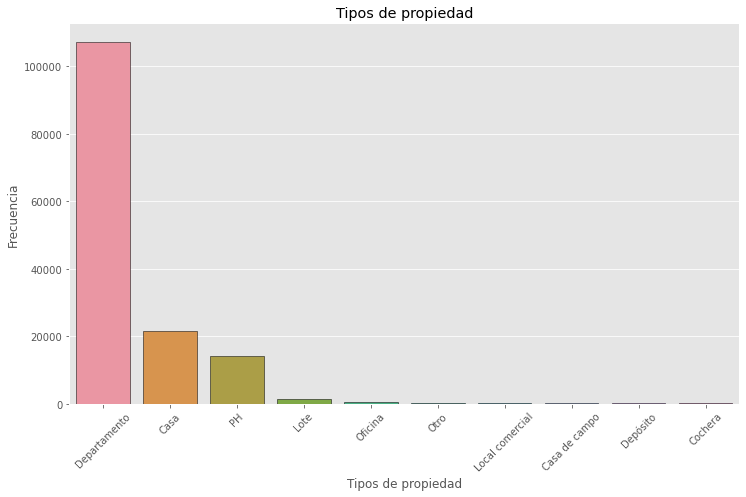

In [7]:
# Conteo según el tipo de propiedad en orden descendente
plt.figure(figsize=(12,7))
count_property = sns.countplot(x='property_type', data=data, order = data["property_type"].value_counts().index,
                               edgecolor=(0,0,0));
count_property.set_xticklabels(count_property.get_xticklabels(),rotation=45);
count_property.set_title("Tipos de propiedad")
count_property.set_ylabel("Frecuencia")
count_property.set_xlabel("Tipos de propiedad");

4. ¿De qué regiones son las publicaciones?

Conteo de as publicaciones según la zona, en orden descendente:

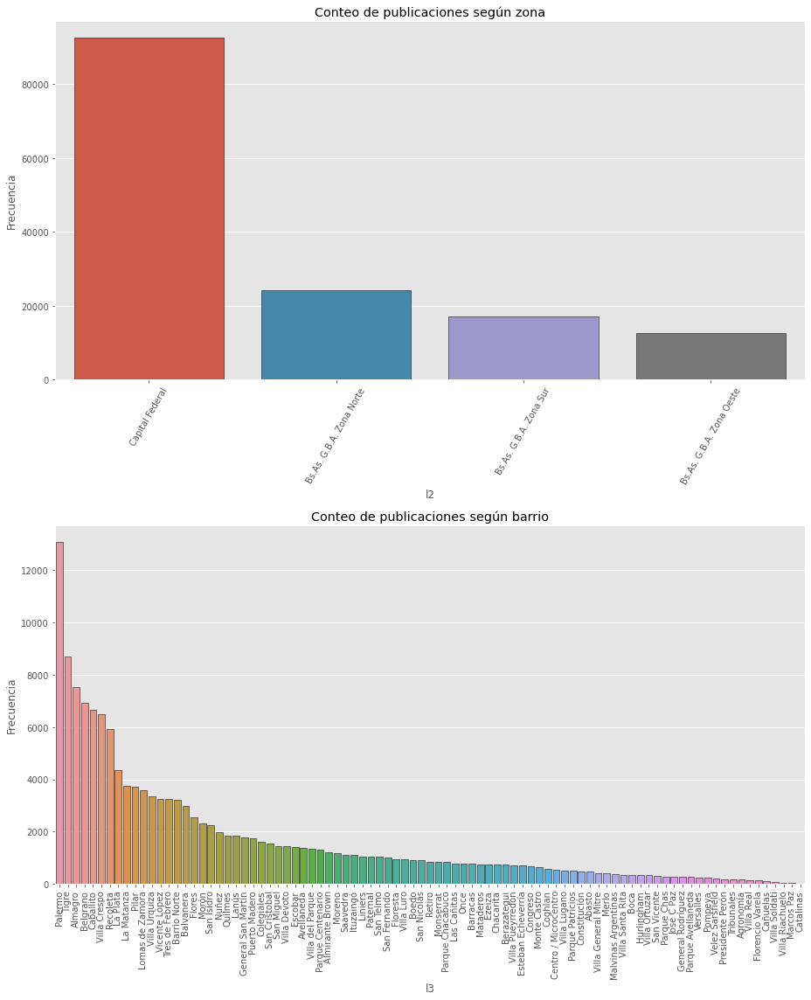

In [8]:
plt.figure(figsize=(13,16))
plt.subplot(211)
count_region2 = sns.countplot(x='l2', data=data, order = data['l2'].value_counts().index, edgecolor=(0,0,0));
count_region2.set_xticklabels(count_region2.get_xticklabels(),rotation=60);
count_region2.set_title("Conteo de publicaciones según zona")
count_region2.set_ylabel("Frecuencia");
   
plt.subplot(212)
count_region3 = sns.countplot(x='l3', data=data, order = data['l3'].value_counts().index, edgecolor=(0,0,0));
count_region3.set_xticklabels(count_region3.get_xticklabels(),rotation=90);
count_region3.set_title("Conteo de publicaciones según barrio")
count_region3.set_ylabel("Frecuencia");

plt.tight_layout()

En la primera gráfica de las 2 anteriores se puede observar que la zona donde hay más publicaciones corresponde a Capital Federal. Por otro lado, la segunda gráfica muestra de manera descendente el número de publicaciones por barrio, donde se observa que el barrio Palermo (perteneciente a Capital Federal) es el que más publicaciones tiene. Veamos valores exactos:

In [9]:
print(f'Número de publicaciones de Capital Federal: \n{data[data["l2"] == "Capital Federal"]["l2"].value_counts()}\n')
print(f'Número de publicaciones del barrio Palermo: \n{data[data["l3"] == "Palermo"]["l3"].value_counts()}')

Número de publicaciones de Capital Federal: 
Capital Federal    92539
Name: l2, dtype: int64

Número de publicaciones del barrio Palermo: 
Palermo    13073
Name: l3, dtype: int64


5. **Filtrando el Dataset:**

En las imágenes anteriores se puede observar que el top 3 de los tipos de propiedad es, respecivamente:

1. Departamento
2. Casa
3. PH

Por otro lado, la región con más propiedades publicadas es *Capital Federal*.

El dataset filtrado con sólo estos 3 tipos de propiedad y la region con más propiedades publicadas es:

In [10]:
top3_df = data[((data["property_type"] == "Departamento") | (data["property_type"] == "Casa") | (data["property_type"] == "PH"))
               & (data["l2"] == "Capital Federal")]
print(f"El número de filas del dataset es:    {top3_df.shape[0]}")
print(f"El número de columnas del dataset es: {top3_df.shape[1]}")

El número de filas del dataset es:    91485
El número de columnas del dataset es: 19


6. **Distribuciones y relaciones de a pares:** Estudio de la distribución y las relaciones de a pares de las variables `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered`, `price` para cada tipo de propiedad. 
    
Para resolver este problema, vamos a crear un nuevo DataFrame **`pares_df`**, el cual llevará únicamente las columnas que se necesitan para hacer el análisis descrito (las columnas *l3, lon y lat* se incluirán para hacer un proceso extra más adelante):

In [11]:
pares_df = top3_df[["property_type", "rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered", "price", "l3", "lon", 
                    "lat"]]
pares_df.head()

,property_type,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,l3,lon,lat
0,Departamento,7.0,7.0,2.0,140.0,140.0,153000.0,San Cristobal,-58.384949,-34.605880
1,PH,2.0,1.0,2.0,70.0,58.0,159000.0,Boedo,-58.412110,-34.624056
2,PH,2.0,1.0,1.0,45.0,45.0,125000.0,Palermo,-58.427474,-34.593569
3,PH,2.0,1.0,1.0,85.0,50.0,295000.0,Palermo,-58.436754,-34.581294
5,PH,2.0,1.0,1.0,56.0,56.0,150000.0,Villa Crespo,-58.441239,-34.593779


Veamos una descripción general del dataset filtrado:

In [12]:
pares_df.describe()

,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,lon,lat
count,91485.000000,91485.000000,89314.000000,82568.000000,82250.000000,9.148500e+04,86937.000000,86951.000000
mean,2.964278,1.960278,1.560147,112.626369,94.966310,2.595003e+05,-58.436002,-34.599081
std,1.314704,1.072946,0.860309,980.713664,778.515243,3.222654e+05,0.036297,0.023957
min,1.000000,0.000000,1.000000,10.000000,1.000000,6.000000e+03,-58.530468,-34.696419
25%,2.000000,1.000000,1.000000,49.000000,44.000000,1.200000e+05,-58.459605,-34.613757
50%,3.000000,2.000000,1.000000,71.000000,63.000000,1.750000e+05,-58.433789,-34.599446
75%,4.000000,3.000000,2.000000,111.000000,96.000000,2.790000e+05,-58.410143,-34.584148
max,26.000000,15.000000,14.000000,126062.000000,126062.000000,3.243423e+07,-58.353930,-34.535818


Centremos nuestra atención en las variables continuas:

- Superficie cubierta: Se observa que el valor mínimo corresponde a 1 $m^2$, lo cual es absurdo para que una persona pueda vivir.
- Superficie total: Hay unos puntos que pueden representar un problema a la hora de hacer un análisis de correlaciones, ya que se observa que el valor máximo está varios órdenes de magnitud por encima del valor promedio.
- Precio: Hay un amplio rango en los precios, siendo la media del orden de $10^5$, el mínimo de $10^3$  el máximo de $10^7$.

A continuación se detallan algunos procesos de filtrado:

**- Rango de precios**

Empecemos a filtrar el dataset con la variable *precio*, ya que entre todas, es la que toma un rango más amplio, y al reducir ésta, es posible que los demás filtros eliminen menos datos. Un boxplot nos aclarará un poco el panorama:

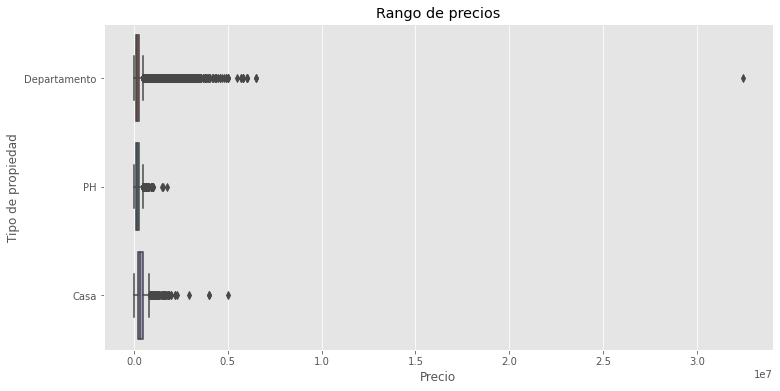

In [13]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="price", y="property_type", data=pares_df);
#plt.ticklabel_format(style = 'plain',axis = 'y')
ax.set_title("Rango de precios")
ax.set_xlabel("Precio")
ax.set_ylabel("Tipo de propiedad");

Se observa que la mayoría de precios están por debajo de los 5000000 USD. Veamos cuáles propiedades están por encima de ese valor:

In [14]:
pares_df[pares_df["price"] > 5000000]

,property_type,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,l3,lon,lat
5130,Departamento,6.0,3.0,3.0,600.0,600.0,6000000.0,Recoleta,-58.388513,-34.586819
31041,Departamento,8.0,5.0,5.0,677.0,568.0,5800000.0,Recoleta,-58.397276,-34.587383
35814,Departamento,6.0,3.0,3.0,600.0,600.0,6000000.0,Recoleta,-58.388513,-34.586819
39490,Departamento,8.0,4.0,5.0,516.0,456.0,5500000.0,Belgrano,-58.440101,-34.552850
39938,Departamento,6.0,3.0,3.0,600.0,600.0,6000000.0,Recoleta,-58.388513,-34.586819
48077,Departamento,10.0,4.0,3.0,978.0,489.0,5700000.0,Recoleta,-58.389012,-34.586326
76894,Departamento,1.0,1.0,4.0,43.0,43.0,32434232.0,Palermo,-58.415855,-34.593956
82093,Departamento,4.0,3.0,3.0,600.0,600.0,5800000.0,Recoleta,-58.388855,-34.586537
94655,Departamento,5.0,3.0,3.0,771.0,611.0,6500000.0,Puerto Madero,-58.362648,-34.614977
97166,Departamento,5.0,3.0,3.0,771.0,611.0,6500000.0,Puerto Madero,-58.362648,-34.614977


No hay inconsistencias evidentes en estas instancias (exceptuando por aquel Departamento ubicado en Palermo, cuya superficie no tiene sentido para su elevado precio). Sin embargo, trabajaremos un filtro teniendo en cuenta el *boxplot*. En un diagrama de cajas, el ancho de la caja (IQR: *Rango Inter-Cuartílico*) nos indica que al menos el 75% de los datos está dentro de la caja.

Se observa que para el tipo de propiedad *Casa*, el ancho de la caja sobresale más que los otros; éste podría ser un buen valor de cota, ya que las demás categorías están por debajo, lo que asegura tener **por lo menos** el 75% de los datos de cada una.

En este orden de ideas, creemos una función `distancia_bigotes` para ver a qué valor de superficie total corresponde el quantil 75 y 25, para hallar el IQR (ancho de la caja) y la posición de los bigotes:

In [15]:
def distancia_bigotes(property_type, variable):
    q_75 = pares_df[pares_df["property_type"] == property_type][variable].quantile(0.75)
    q_25 = pares_df[pares_df["property_type"] == property_type][variable].quantile(0.25)
    IQR = q_75 - q_25
    bigote_sup = q_75 + 1.5*IQR
    bigote_inf = q_25 - 1.5*IQR

    print(f"Quantil 75: {q_75}")
    print(f"Quantil 25: {q_25}")
    print(f"Rango Inter-Cuartílico: {IQR}")
    #print(f"El bigote inferior está a un valor de {variable} {bigote_inf}")
    print(f"El bigote superior está a un valor de {variable} {bigote_sup}")
    
    return bigote_sup, bigote_inf

In [16]:
bigote_sup, bigote_inf = distancia_bigotes("Casa", "price")

Quantil 75: 480000.0
Quantil 25: 240000.0
Rango Inter-Cuartílico: 240000.0
El bigote superior está a un valor de price 840000.0


Ahora apliquemos un filtro con este valor de precio:

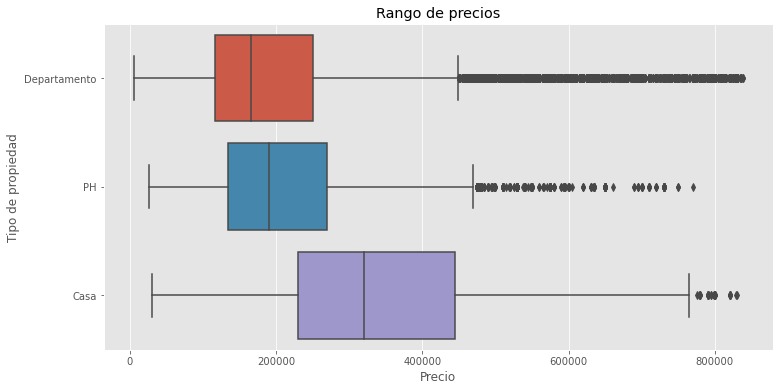

In [17]:
pares_df = pares_df[pares_df["price"] < bigote_sup]
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="price", y="property_type", data=pares_df);
#plt.ticklabel_format(style = 'plain',axis = 'y')
ax.set_title("Rango de precios")
ax.set_xlabel("Precio")
ax.set_ylabel("Tipo de propiedad");

**- Superficies totales con valores muy elevados**

Veamos con una gráfica un poco más clara, qué sucede con los valores de superficie total:

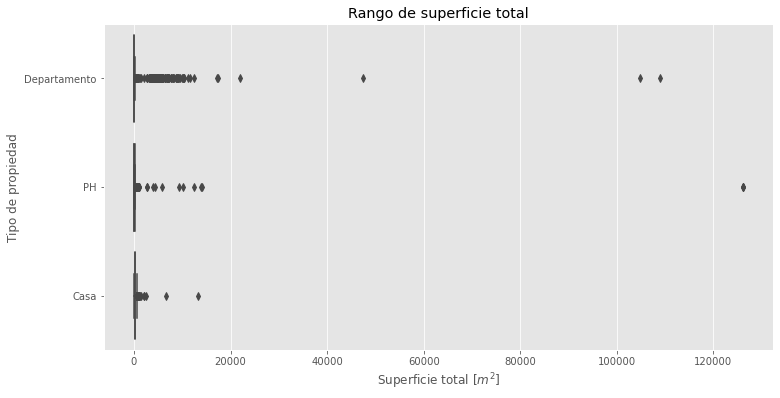

In [18]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="surface_total", y="property_type", data=pares_df);
ax.set_title("Rango de superficie total")
ax.set_xlabel("Superficie total [$m^2$]")
ax.set_ylabel("Tipo de propiedad");

Se observa que la mayoría de inmuebles están por debajo de los 20000 $m^2$. Veamos qué ocurre con los valores mayores a este:

In [19]:
pares_df[pares_df["surface_total"] > 20000]

,property_type,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,l3,lon,lat
13243,PH,5.0,4.0,3.0,126062.0,126062.0,220000.0,Caballito,-58.455126,-34.606165
35231,PH,5.0,4.0,3.0,126062.0,126.0,240000.0,Caballito,-58.455126,-34.606165
36331,Departamento,3.0,2.0,2.0,108960.0,78.0,290000.0,Villa Crespo,-58.433762,-34.595865
42655,Departamento,3.0,2.0,1.0,47360.0,47360.0,116000.0,Almagro,-58.419286,-34.603410
90235,PH,5.0,4.0,3.0,126062.0,126062.0,215000.0,Caballito,-58.455126,-34.606165
102042,Departamento,4.0,3.0,1.0,104890.0,104890.0,265000.0,Barrio Norte,-58.420859,-34.583401
118389,Departamento,1.0,1.0,1.0,21920.0,21920.0,50000.0,Congreso,-58.394502,-34.606750


A primera vista parece que no hay inconsistencias, pero aunque posible, podemos observar que éstas propiedades con superficies totales muy elevadas tienen una superficie cubierta o muy pequeña o del tamaño total; ésta característica deja mucho qué pensar, puesto que un Departamento o PH sería muy pequeño o muy grande para las dimensiones de la superficie total correspondiente.

Para observar de manera más clara los bigotes del boxplot anterior, vamos a depurar el dataset dejando como límite superior este valor:

In [20]:
pares_df = pares_df[pares_df["surface_total"] < 20000]
pares_df.shape

(79496, 10)

Veamos nuevamente la distribución:

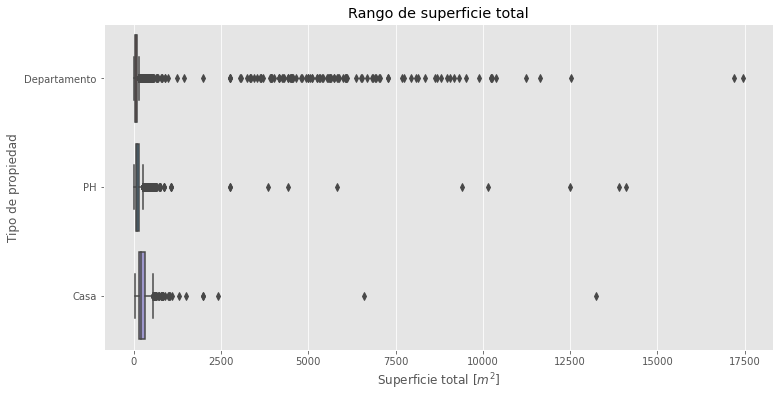

In [21]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="surface_total", y="property_type", data=pares_df);
ax.set_title("Rango de superficie total")
ax.set_xlabel("Superficie total [$m^2$]")
ax.set_ylabel("Tipo de propiedad");

Se observa que para el tipo de propiedad *Casa*, el ancho de la caja sobresale más que los otros; éste podría ser un buen valor de cota, ya que las demás categorías están por debajo, lo que asegura tener **por lo menos** el 75% de los datos de cada una.

En este orden de ideas, hagamos el mismo tratamiento con el IQR:

In [22]:
bigote_sup, bigote_inf = distancia_bigotes("Casa", "surface_total")

Quantil 75: 316.0
Quantil 25: 160.0
Rango Inter-Cuartílico: 156.0
El bigote superior está a un valor de surface_total 550.0


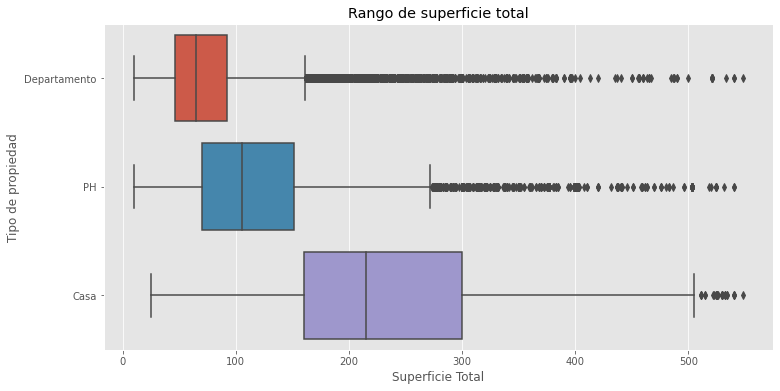

In [23]:
pares_df = pares_df[pares_df["surface_total"] < bigote_sup]
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="surface_total", y="property_type", data=pares_df);
#plt.ticklabel_format(style = 'plain',axis = 'y')
ax.set_title("Rango de superficie total")
ax.set_xlabel("Superficie Total")
ax.set_ylabel("Tipo de propiedad");

**- Superficies totales con valores muy pequeños**

Primero veamos cuál es el inmueble con superficie más pequeña para darnos una idea de los valores:

In [24]:
print(f"Superficie total más pequeña del dataset: {pares_df.surface_total.min()} m^2")

Superficie total más pequeña del dataset: 10.0 m^2


En una búsqueda a través de Google, se dice que aunque hay personas viviendo con comodidad en espacios de 8 $m^2$, lo mínimo recomendado por individuo es de al menos de 10 a 15 $m^2$. En este caso, redondearemos el valor a 20 $m^2$ de superficie total mínima:

In [25]:
pares_df = pares_df[pares_df["surface_total"] > 20]
pares_df.shape

(79068, 10)

**- Superficies totales menores que superficies cubiertas**

No es posible que en un inmueble, su superficie cubierta sea mayor que su superficie total. Por tanto, se eliminarán las instancias que tengan este inconveniente:

In [26]:
pares_df = pares_df[pares_df["surface_total"] > pares_df["surface_covered"]]
pares_df.shape

(54644, 10)

Veamos la distribución:

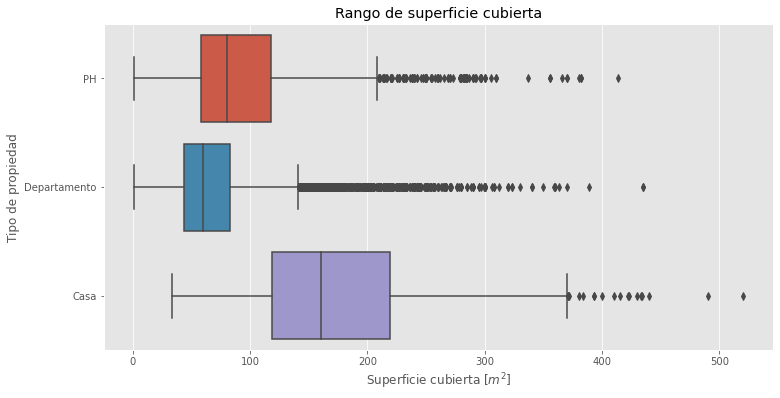

In [27]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="surface_covered", y="property_type", data=pares_df);
ax.set_title("Rango de superficie cubierta")
ax.set_xlabel("Superficie cubierta [$m^2$]")
ax.set_ylabel("Tipo de propiedad");

A pesar de que la distribución ve adecuada, haremos el mismo proceso para quitar algunos datos por fuera de los bigotes:

In [28]:
bigote_sup, bigote_inf = distancia_bigotes("Casa", "surface_covered")

Quantil 75: 219.0
Quantil 25: 118.25
Rango Inter-Cuartílico: 100.75
El bigote superior está a un valor de surface_covered 370.125


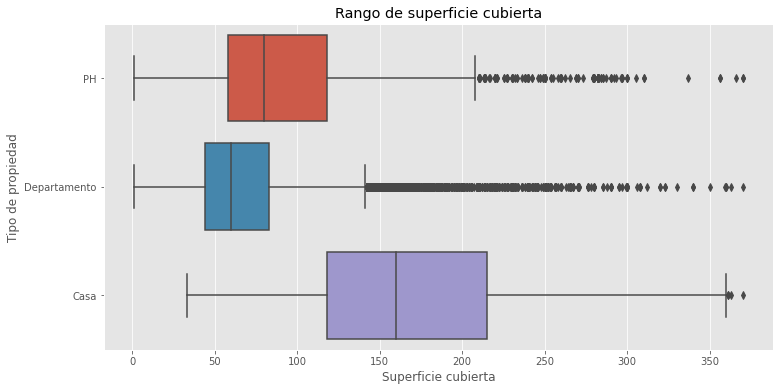

In [29]:
pares_df = pares_df[pares_df["surface_covered"] < bigote_sup]
plt.figure(figsize=(12,6))
ax = sns.boxplot(x="surface_covered", y="property_type", data=pares_df);
#plt.ticklabel_format(style = 'plain',axis = 'y')
ax.set_title("Rango de superficie cubierta")
ax.set_xlabel("Superficie cubierta")
ax.set_ylabel("Tipo de propiedad");

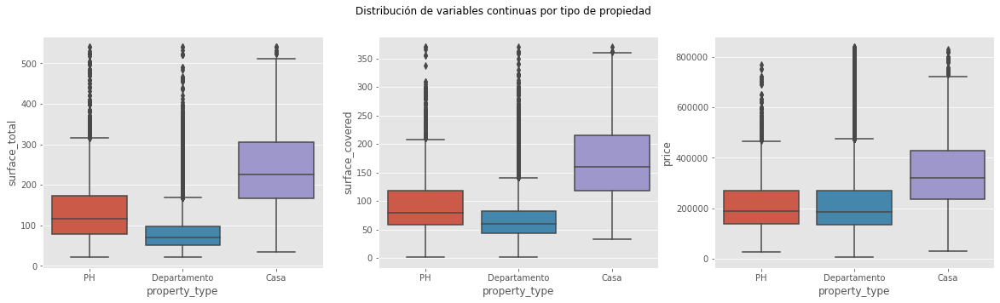

In [30]:
#Realizamos diagrama de cajas para verificar el filtro
fig, axes = plt.subplots(1, 3, figsize=(20,5));
fig.suptitle('Distribución de variables continuas por tipo de propiedad');
sns.boxplot( x=pares_df['property_type'], y=pares_df['surface_total'], ax = axes[0]);
sns.boxplot( x=pares_df['property_type'], y=pares_df['surface_covered'], ax = axes[1]);
sns.boxplot( x=pares_df['property_type'], y=pares_df['price'], ax = axes[2]);

**- Valores faltantes (no dados)**

Veamos cómo quedó el dataset después de los filtros hechos:

In [31]:
pares_df.isna().sum()

property_type         0
rooms                 0
bedrooms              0
bathrooms           514
surface_total         0
surface_covered       0
price                 0
l3                    0
lon                2610
lat                2610
dtype: int64

Vemos que los valores faltantes que nos quedan en el dataset no son muchos, comparado con la cantidad de datos que tenemos. Debido a que no es adecuado reemplazarlos por valores vecinos o una media, sin tener argumentos fuertes, se procede a eliminarlos:

In [32]:
pares_df.dropna(subset=['bathrooms'], inplace=True)
pares_df = pares_df.reset_index(drop=True)
#pares_df.isna().sum()

Procedemos a realizar un `pairplot`:

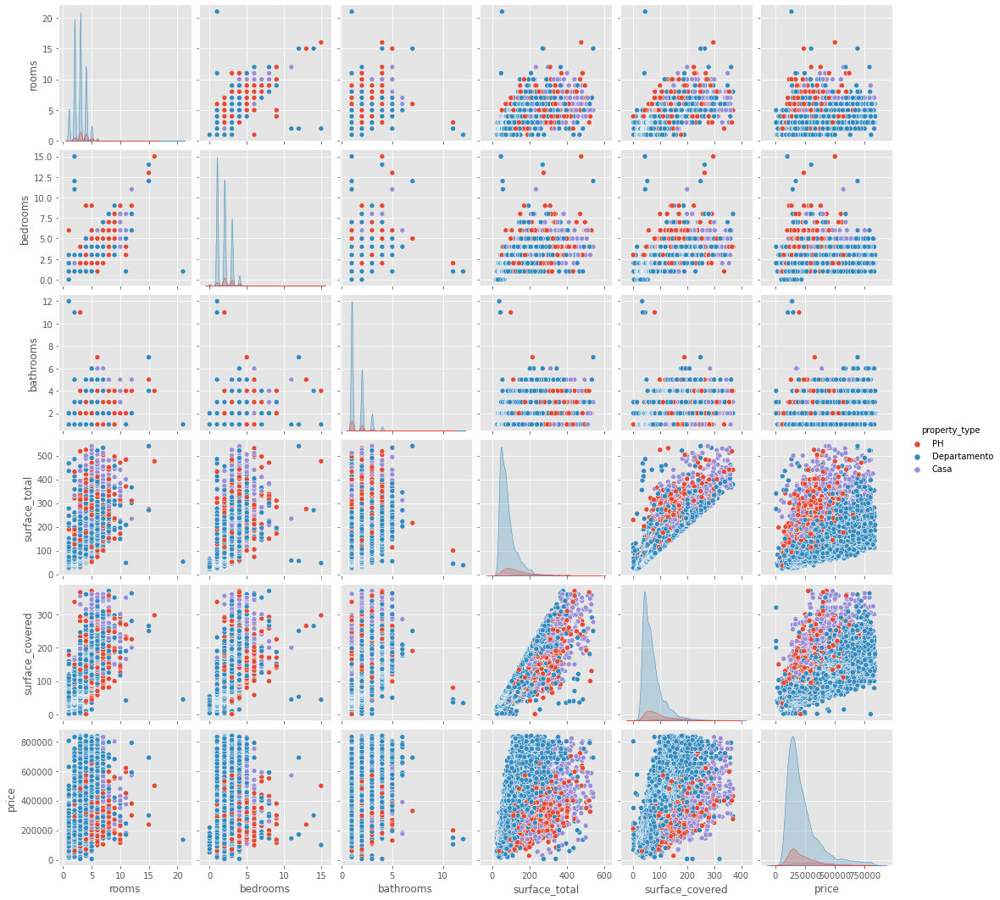

In [33]:
ax = sns.pairplot(pares_df[["property_type", "rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered", "price"]], hue="property_type");
# plt.savefig("pairplot.png")

7. **Correlaciones:**

Miremos la matriz de correlaciones para el dataset general:

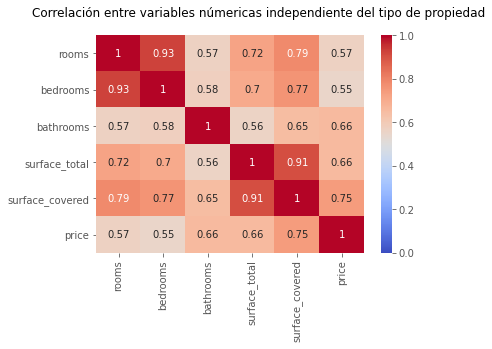

In [34]:
plt.suptitle('Correlación entre variables númericas independiente del tipo de propiedad');
sns.heatmap(pares_df[[ "rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered", "price"]].corr(), annot=True, 
            cmap='coolwarm', vmin=0);

Ahora para cada tipo de propiedad:

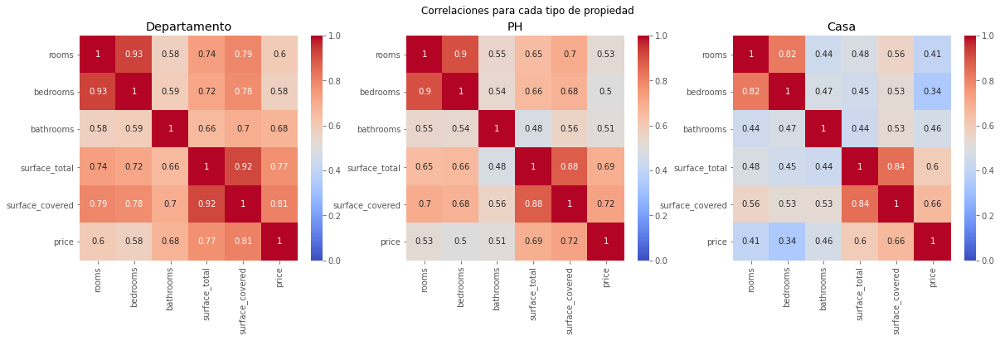

In [35]:
fig, axes = plt.subplots(1, 3, figsize=(20,5));
fig.suptitle('Correlaciones para cada tipo de propiedad');
sns.heatmap(pares_df[["property_type", "rooms", "bedrooms", "bathrooms", "surface_total",
                      "surface_covered", "price"]][pares_df["property_type"] == "Departamento"].corr(),
            annot=True, cmap='coolwarm', vmin=0, ax=axes[0]);
axes[0].set_title('Departamento');
sns.heatmap(pares_df[["property_type", "rooms", "bedrooms", "bathrooms", "surface_total",
                      "surface_covered", "price"]][pares_df["property_type"] == "PH"].corr(),
            annot=True, cmap='coolwarm', vmin=0, ax=axes[1]);
axes[1].set_title('PH');
sns.heatmap(pares_df[["property_type", "rooms", "bedrooms", "bathrooms", "surface_total",
                      "surface_covered", "price"]][pares_df["property_type"] == "Casa"].corr(),
            annot=True, cmap='coolwarm', vmin=0, ax=axes[2]);
axes[2].set_title('Casa');

De estas matrices de correlaciones se pueden concluir algunas cosas interesantes:

- Un apartamento suele tener poca superficie extra a parte de la superficie ocupada por el inmueble (correlación del 92% entre superficie cubierta y superficie total), en comparación con un PH o una Casa.
- En los 3 tipos de propiedad, lo que más influye en el precio es la superficie cubierta, siendo mayor la correlación en Departamento y menor en Casa.

### ¿Cuál es el barrio más caro de Buenos Aires?

Para encontrar el barrio más costoso de Buenos Aires, según los filtros que hemos hecho en el dataset, haremos lo siguiente:


In [36]:
barrios = pares_df["l3"].unique() #nombres de los barrios
mean_price = []                   #precio medio para cada barrio

for i in barrios:
    mean_price.append(pares_df[pares_df["l3"] == i]["price"].mean())
    
index_max = np.where(mean_price == np.max(mean_price)) #indice para el cual la media del precio es maxima
barrio_max = barrios[index_max[0][0]]                  #busqueda del barrio mas costoso con el indice encontrado

print(f'El barrio más costoso de Buenos Aires es: {barrio_max}')

El barrio más costoso de Buenos Aires es: Puerto Madero


Se observa entonces que el barrio más costoso de Buenos Aires es Puerto Madero, y según lo que se buscó en la web, éste barrio tiene rascacielos y restaurantes de lujo, por lo que en primera aproximación es correcto lo que nos está arrojando el dataset.

Los sesgos de ésta respuesta pueden estar centrados a nivel general en la depuración de los outliers, pues los filtros que se realizaron pudieron haber sido muy abruptos y la eliminación de algunos datos significativos pueden cambiar las estadísticas de una manera sustancial. Además, es bueno tener presente que éste dataset corresponde solo a una muestra de datos de toda una población, por lo que de entrada puede haber una incertidumbre general.

## Conclusiones de la primera parte

Hemos hecho una aproximación inicial a la información que nos provee éste dataset, pero es evidente que el tratamiento de los outliers no pudo ser el más adecuado, ya que existen diversas técnicas y conceptos más avanzados que se pueden aplicar en este punto de filtrado de los datos; como ejemplo tenemos:

- **Criterio de las 3$\sigma$:** éste criterio se usa para distribuciones que se aproximan a las Gaussianas, y aunque las distribuciones de éste dataset pueden no serlo, por su asimetría en los rangos de los precios por ejemplo, podríamos ayudarnos del teorema del Límite Central y decir que si tuviéramos una mayor cantidad de datos, todas las distribuciones tienden a una Gaussiana. Además, éste criterio encaja el 88.8% de veces en distribuciones no normales, y puede reducir los datos outliers de una manera no tan abrupta como lo hicimos aquí.

- **Logaritmo:** Al manejar datos con valores tan elevados y tan dispersos entre sí, una buena forma de reducir sus magnitudes es aplicando la función logaritmo a todo el dataset, y debido a que su función inversa es de fácil adquisición, la transformación inversa de los datos no sería un inconveniente. Ésta transformación permite obtener una mayor correlación de los datos, que evidentemente no se verían con los datos puros.

## Extra

En ésta sección se hará un tratamiento extra a los datos para jugar un poco con mapas coropléticos, aprovechando la información geo-referencial que poseemos de cada propiedad: latitud y longitud.

Se puede interactuar con el mapa haciendo zoom y pasando el cursor por encima de los puntos para observar alguna información. Los colores y tamaños de los puntos están categorizados en base al precio de la propiedad.

**NOTA:** Si el mapa no está cargado en este notebook, por favor dirigirse al archivo *buenos_aires.html* que se compartió junto a este trabajo.

In [37]:
pares_df.dropna(subset=['lon', 'lat'], inplace=True)
pares_df = pares_df.reset_index(drop=True)
#pares_df.isna().sum()

In [38]:
#Datos del mapa
data1 = [go.Scattermapbox(
    lon = pares_df['lon'], #Longitud de los marcadores.
    lat = pares_df['lat'], #Latitud de los marcadores.
    marker = dict(
        size = 2 + pares_df['price']/100000, #Tamaño del marcador a partir del valor reescalado del precio.               
        color= np.round(pares_df['price']), #Color del marcador, igualmente utilizando el precio
        showscale = True,
        colorscale= 'YlOrRd',
    ),
    text=pares_df[['l3', 'property_type','price']] #Texto. En este caso es la región, tipo de propiedad y precio
)]

In [39]:
#Token de prueba de Mapbox. Puede crear una cuenta y usar su propio token reemplazando este código.
token='pk.eyJ1IjoiZmVyZXN0cmVwb2NhIiwiYSI6ImNqdHQ4Zzc4MTE5MDA0NG1zeXlwMHBmZjMifQ.gdi4f1MAJor5u5_YWGCzOw' 

#Detalles del layout
layout = dict(
        title = 'Inmuebles Capital Federal',
        #Configuración interna de Mapbox
        mapbox = dict( 
            accesstoken = token, # TOKEN DE ACCESO
            center= dict(lat=-34.60, lon=-58.37), #Coordenada donde centrar el mapa inicialmente (Bogotá aprox.).
            zoom=10, #Acercamiento inicial del mapa.
        ),
        width = 1000,
        height = 1000
    )

In [40]:
## Generación de la figura
fig = go.Figure(data=data1, layout=layout)
fig.show()
fig.write_html('buenos_aires.html')

## 3. Machine Learning
---

### **Librerías a usar:**

A continuación importamos la librerias de knn, arboles de decisión, y adicional importamos la métrica para evaluar el modelo, la cual sera la raíz del error cuadratico medio RMSE y el coeficiente de determinación $R^2$ . Usaremos la métrica RMSE dado que es sensible a valores outliers en el conjunto de datos, por tanto de entrada, nuestros modelos de entrenamiento serán poco eficientes, dado que hasta el momento no hemos realizado ninguna transformación. En adición usaremos el coeficiente de determinación que en primera aproximación nos puede dar información sobre que tan bueno es el ajuste.

Es necesario aclarar que en este caso $R^2$ no es una buena métrica de evaluación, pues este solo es relevante en un modelo con solo una variable independiente y en nuestro modelo de entrenamiento tenemos 5 variables, que en principio 4 de ellas son linealmente independientes. En casos con más de una variable independiente es más útil usar $R^2_{adjusted}$.
Existe otra métrica útil de considerar como lo es Root Mean Squared Logarithmic Error, pero en este caso no la usaremos.

In [41]:
from sklearn.model_selection import train_test_split #Separación de datos de entrenamiento y test
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor    #Vecinos más cercanos
from sklearn.tree import DecisionTreeRegressor       #Árboles de decisión
from sklearn.metrics import mean_squared_error       #Métrica para evaluación (MSE - Error cuadrático medio)
from sklearn.metrics import r2_score                 #Métrica de desempeño (R cuadrado)

### **Lectura y filtro inicial de datos:**

Comenzaremos a filtrar los datos como lo sugieren:

In [42]:
df = pd.read_csv("DS_Proyecto_01_Datos_Properati.csv")

In [43]:
#Propiedades tipo Departamento, PH o Casa ubicadas en Capital Federal
df_clean = df[(df["l2"] == "Capital Federal") & ((df["property_type"] == "Departamento") |
              (df["property_type"] == "Casa") | (df["property_type"] == "PH"))]

#Superficies totales entre 15 y 1000 m2
df_clean = df_clean[(df_clean["surface_total"] >= 15) & (df_clean["surface_total"] <= 1000)]

#Propiedades con precios menores que 4000000 USD
df_clean = df_clean[df_clean["price"] <= 4000000]

#Selección de columnas solicitadas
columns = ['rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered', 'price']
df_clean = df_clean[columns]

#Eliminar datos faltantes
df_clean.dropna(inplace=True)

#Reiniciar los índices para quedar con un dataset como nuevo
df_clean.reset_index(drop=True, inplace=True)

print(f'El dataset a trabajar tiene dimensiones: {df_clean.shape}')

El dataset a trabajar tiene dimensiones: (81019, 6)


### **Selección de variables predictorias y variable objetivo:**

Para este proyecto, la variable objetivo $y$ es el precio y la matriz de variables predictorias $X$ estará constituida por el resto de columnas del dataset filtrado:

In [44]:
X = df_clean.drop(columns[-1], axis=1)
y = df_clean['price']
pd.DataFrame(X).head()

,rooms,bedrooms,bathrooms,surface_total,surface_covered
0,7.0,7.0,2.0,140.0,140.0
1,2.0,1.0,2.0,70.0,58.0
2,2.0,1.0,1.0,45.0,45.0
3,2.0,1.0,1.0,85.0,50.0
4,2.0,1.0,1.0,56.0,56.0


### **Selección de datos de entrenamiento y test:**

Para este modelo, trabajaremos con el 70% de los datos para el entrenamiento y el 30% para el test.

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Modelo Benchmark

A continuación se definirá el modelo benchmark para trabajar en base a él:

In [46]:
def Benchmark(X_train, y_train, X_test, y_test):
    '''X_train: arreglo de numpy de shape (n, m) con las características de entrenamiento
       y_train: arreglo de numpy de shape (n,) con las etiquetas de clase de entrenamiento
       X_test: arreglo de numpy de shape (n, m) con las características de prueba
       y_test: arreglo de numpy de shape (n,) con las etiquetas de prueba
       Solo imprime en pantalla el RMSE para el conjunto de entrenamiento, prueba y R**2 y grafica nuestro mode base'''
    linear_model = LinearRegression()
    linear_model.fit(X_train, y_train)
    y_train_pred = linear_model.predict(X_train)
    y_test_pred = linear_model.predict(X_test)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2 = r2_score(y_test, y_test_pred)
    
    #Grafico función
    plt.figure(dpi=120);
    plt.scatter(y_test_pred,y_test, s=10,alpha=0.9, color='r');
    plt.legend();
    plt.xticks();
    plt.title("Modelo Benchmark");
    plt.ylabel("Precio real");
    plt.xlabel("Precio predicho");
    print(f'Raíz del error cuadrático medio en Train: {rmse_train:0.3f}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
    print(f'Coeficiente de determinación R2: {r2:0.3f}')

No handles with labels found to put in legend.


Raíz del error cuadrático medio en Train: 199173.833
Raíz del error cuadrático medio en Test: 202449.365
Coeficiente de determinación R2: 0.551


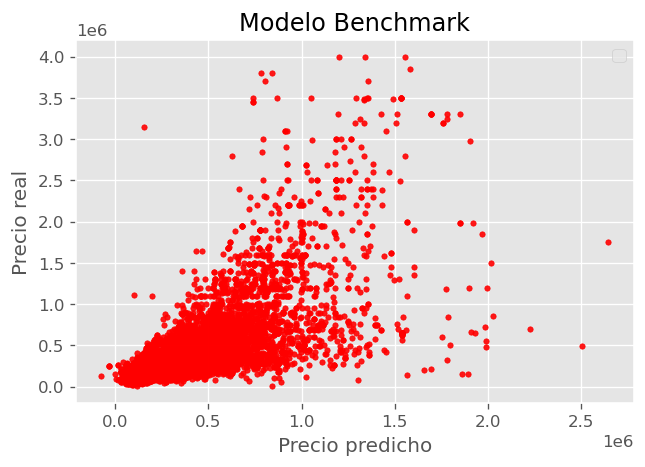

In [47]:
Benchmark(X_train, y_train, X_test, y_test)

El RMSE de los datos de prueba y entrenamiento nos muestran que éste es un mal modelo de entrenamiento, ésto se debe a la gran dispersión de los datos con los que se está entrenando el modelo. Como se mencionó anteriormente, la métrica de evaluación que estamos usando es muy sensible a valores atípicos, y esto hace que no prediga bien.

El propósito de los pasos siguientes será mejorar el resultado arrojado por la métrica de evaluación con los modelos de vecinos más cercanos y árboles de decisión.

### **Entrenamiento del modelo:**

Se creará una función `modelo` que recibirá el conjunto de datos de entrenamiento, prueba, el modelo a trabajar e hiperparámetros a elegir. Tal función retornará un gráfico con los valores reales vs. valores predichos y los valores de las métricas de evaluación y desempeño:

In [48]:
def modelo(X_train, y_train, X_test, y_test, hiper, modelo):
    """
    Entradas:
    X_train: arreglo de numpy de shape (n, m) con las características de entrenamiento
    y_train: arreglo de numpy de shape (n,) con las etiquetas de clase de entrenamiento
    X_test: arreglo de numpy de shape (n, m) con las características de prueba
    y_test: arreglo de numpy de shape (n,) con las etiquetas de prueba
    hiper: hiperparámetro
    modelo: 'knn', 'tree' o 'both' (para comparar ambos modelos)
    
    Retorna:
    - En el caso de modelo 'both':
        *Gráfico de valores reales vs. predichos, tando de knn como de árbol de decisión   
    - En el caso de modelo 'knn' o 'tree':
        *rmse_test: Raíz del error cuadrático medio para el conjunto de test
        *rmse_train: Raíz del error cuadrático medio para el conjunto de entrenamiento
        *r2: R cuadrado
    """
    if(modelo == "knn"):        
        knn = KNeighborsRegressor(n_neighbors= hiper)
        knn.fit(X_train, y_train)
        y_test_pred = knn.predict(X_test)
        y_train_pred = knn.predict(X_train)
        rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
        rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
        r2 = r2_score(y_test, y_test_pred)
        
        return rmse_test, rmse_train, r2
    
    elif(modelo == "tree"):
        tree = DecisionTreeRegressor(max_depth=hiper)
        tree.fit(X_train, y_train)
        y_test_pred = tree.predict(X_test)
        y_train_pred = tree.predict(X_train)
        rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
        rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
        r2 = r2_score(y_test, y_test_pred)
        
        return rmse_test, rmse_train, r2
        
    elif(modelo == 'both'):
        knn = KNeighborsRegressor(n_neighbors= hiper)
        knn.fit(X_train, y_train)
        y_test_pred_knn = knn.predict(X_test)
        y_train_pred_knn = knn.predict(X_train)
        rmse_test_knn = np.round(np.sqrt(mean_squared_error(y_test, y_test_pred_knn)),2)
        rmse_train_knn = np.round(np.sqrt(mean_squared_error(y_train, y_train_pred_knn)),2)
        
        tree = DecisionTreeRegressor(max_depth=hiper)
        tree.fit(X_train, y_train)
        y_test_pred_tree = tree.predict(X_test)
        y_train_pred_tree = tree.predict(X_train)
        rmse_test_tree = np.round(np.sqrt(mean_squared_error(y_test, y_test_pred_tree)),2)
        rmse_train_tree = np.round(np.sqrt(mean_squared_error(y_train, y_train_pred_tree)),2)
        
        plt.figure(figsize=(15,6))
        plt.subplot(121)
        plt.plot(y_test_pred_knn, y_test, '.')
        plt.title(f'Vecinos Cercanos, k = {hiper}\nrmse_train = {rmse_train_knn}\nrmse_test = {rmse_test_knn}')
        plt.xlabel('Valores predichos')
        plt.ylabel('Valores reales')
        
        plt.subplot(122)
        plt.plot(y_test_pred_tree, y_test, '.')
        plt.title(f'Árbol de decisión, max_depth = {hiper}\nrmse_train = {rmse_train_tree}\nrmse_test = {rmse_test_tree}')
        plt.xlabel('Valores predichos')
        plt.ylabel('Valores reales')
        
        return False, False, False
        
    else:
        print("Modelo inválido. Intente de nuevo.")
        return False, False, False

A continuación se observará paralelamente cómo se comportan los modelos de vecinos más cercanos y árbol de decisión para diferentes hiperparámetros. También se evaluarán los correspondientes valores de la raíz del error cuadrático medio (RMSE) para los datos de entrenamiento y test:

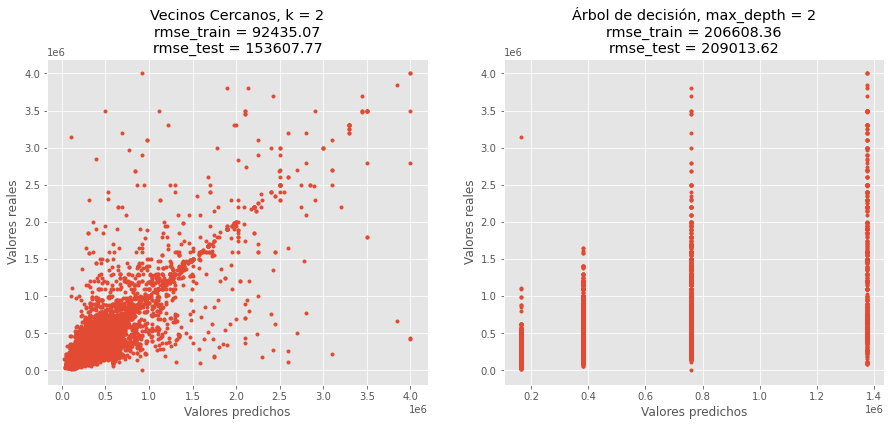

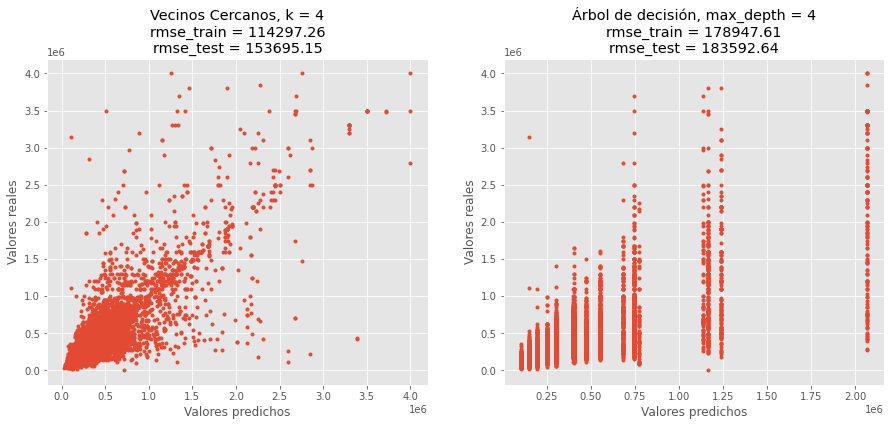

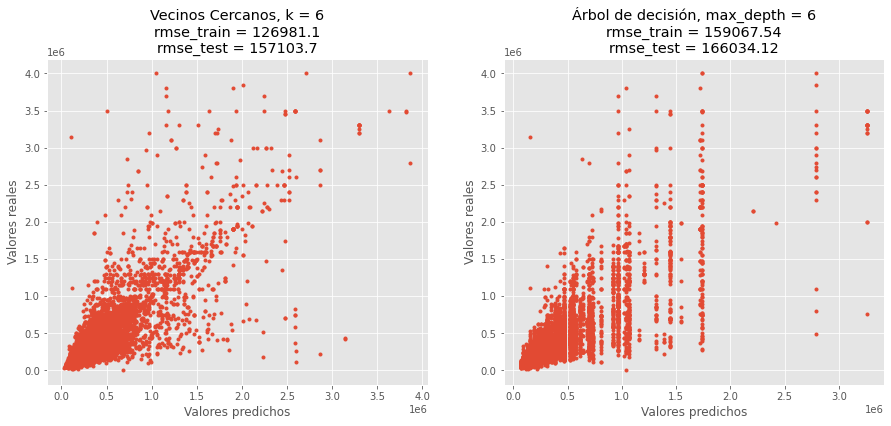

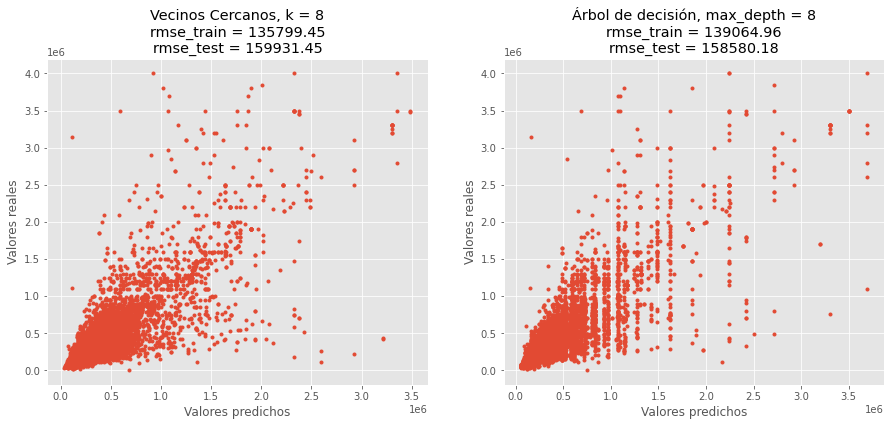

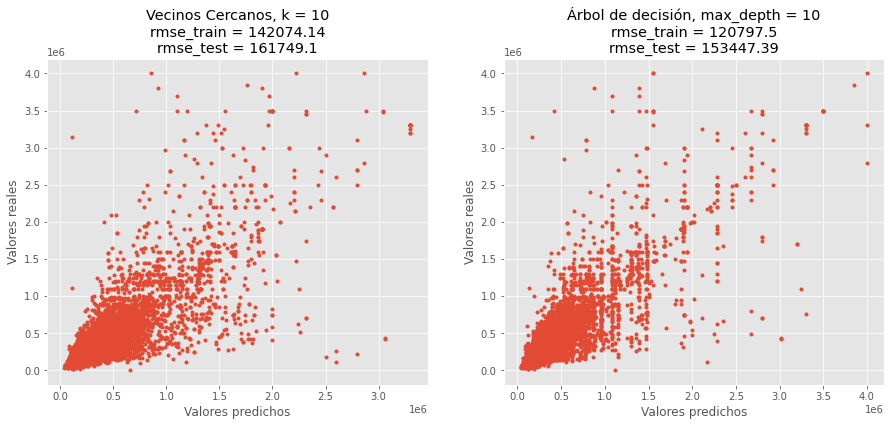

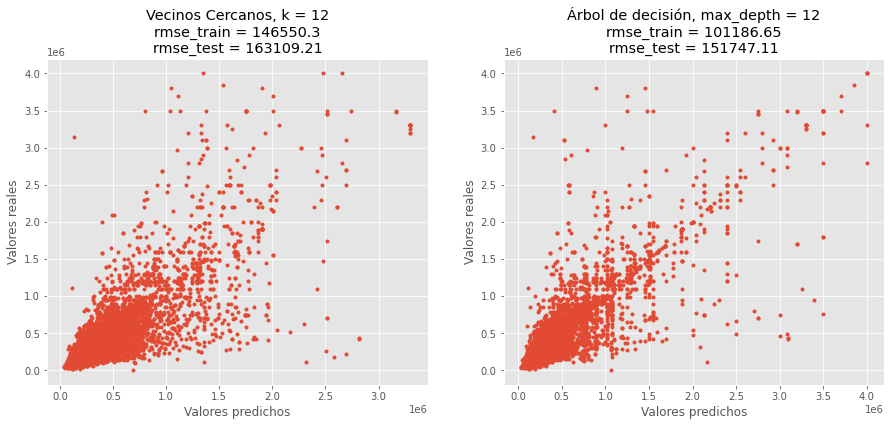

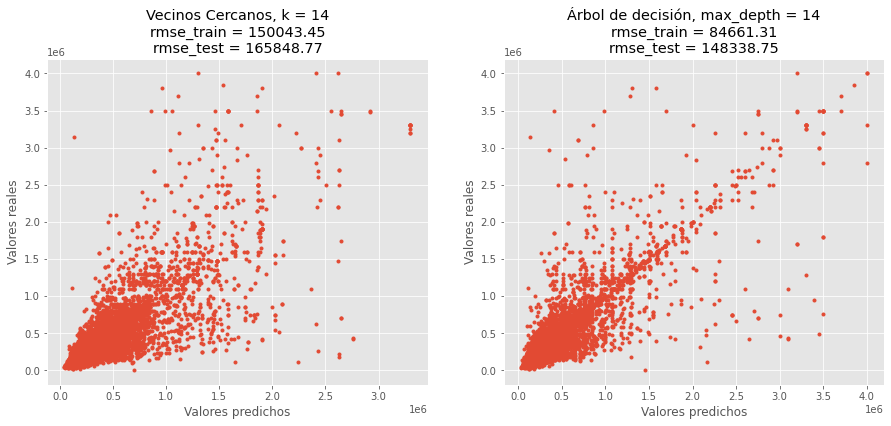

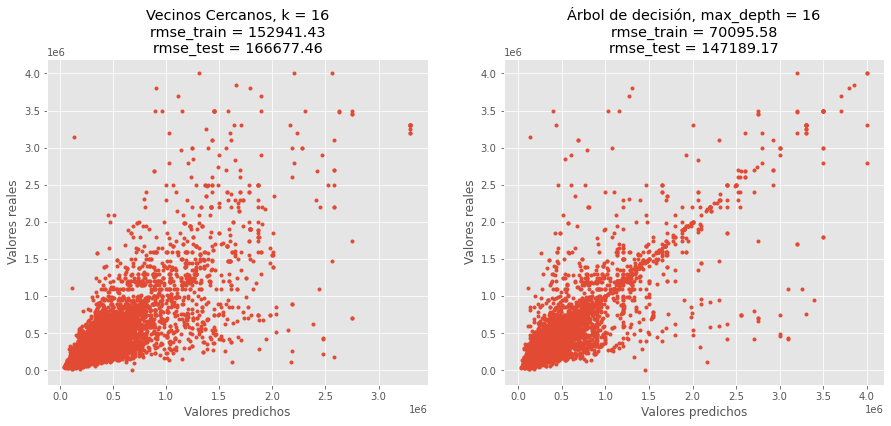

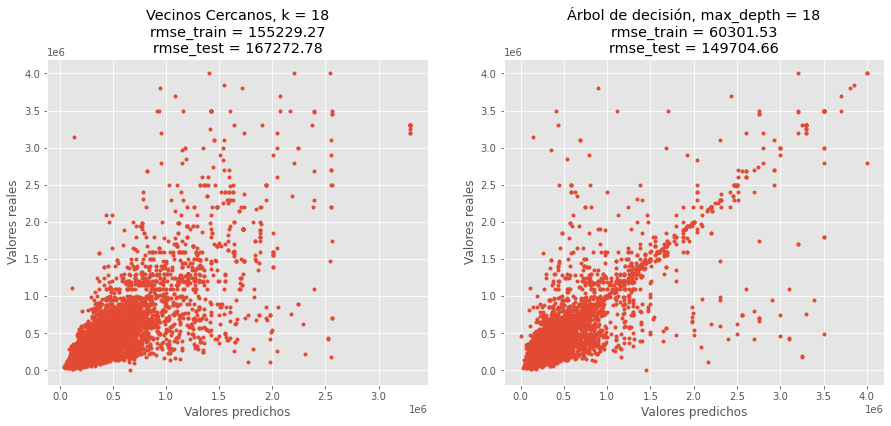

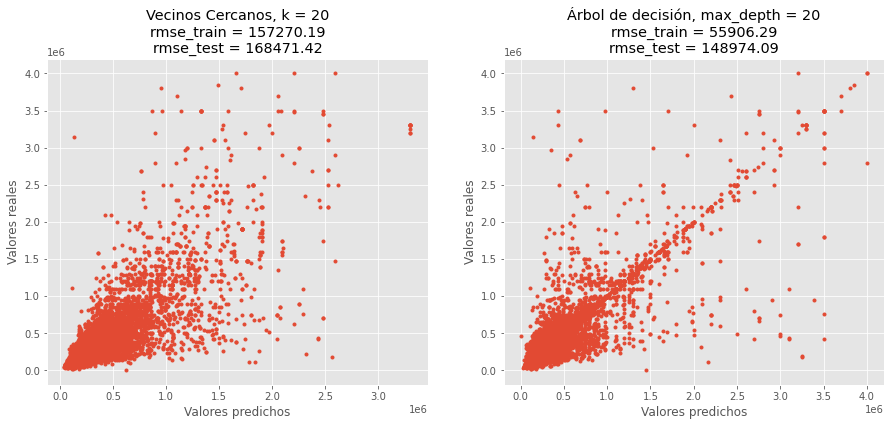

In [49]:
hiper = np.linspace(2, 20, 10)
for i in hiper:
    rmse_test, rmse_train, r2 = modelo(X_train, y_train, X_test, y_test, hiper=int(i), modelo='both')

Se observa una evidente relación inversa entre el comportamiento de cada modelo y su valor de hiperparámetro; es decir, para el modelo de vecinos más cercanos, un hiperparámetro más pequeño tiende a establecer un sobreajuste y por el contrario para el árbol de decisión, tiende a establecer un subajuste.

### **Optimización de hiperparámetros:**

Para establecer el hiperparámetro adecuado para cada modelo, veamos cómo se comporta la métrica RMSE. Para ello, evaluaremos cada modelo con diferentes hiperparámetros:

**- Vecinos más cercanos:**

In [50]:
hiper = list(range(1, 25)) #Lista de hiperparámetros
rmse_te = []
rmse_tr = []
r2 = []
for i in hiper:
    rmse_test, rmse_train, r2_mod = modelo(X_train, y_train, X_test, y_test, hiper=i, modelo='knn')
    rmse_te.append(rmse_test)
    rmse_tr.append(rmse_train)
    r2.append(r2_mod)

Text(3, 137000, '  Punto óptimo')

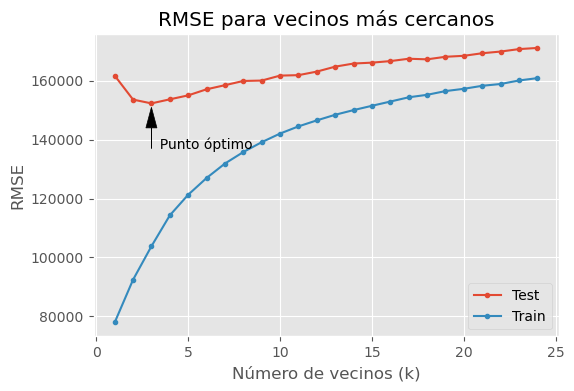

In [51]:
plt.figure(dpi=100)
plt.plot(hiper, rmse_te, '.-', label="Test")
plt.plot(hiper, rmse_tr, '.-', label="Train")
plt.title('RMSE para vecinos más cercanos')
plt.legend()
plt.xticks()
plt.ylabel("RMSE")
_ = plt.xlabel("Número de vecinos (k)")

plt.arrow(3, 137000, 0, 7000, head_width=0.6, head_length=7000, fc='k', ec='k')
plt.text(3, 137000, '  Punto óptimo')

Aquí podemos observar que el punto óptimo se ubica para un número de vecinos, $k=3$. Esto nos indica que ese es el hiperparámetro más adecuado para entrenar el modelo. Veamos:

In [52]:
rmse_test, rmse_train, r2_mod = modelo(X_train, y_train, X_test, y_test, hiper=3, modelo='knn')
# r_adjusted = 1 - ((len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))*(1-r2_mod)
print(f'RMSE entrenamiento: {np.round(rmse_train,2)}')
print(f'RMSE test: {np.round(rmse_test,2)}')
print(f'R cuadrado: {np.round(r2_mod,4)}')
#print(f'R cuadrado ajustado: {np.round(r_adjusted,2)}')

RMSE entrenamiento: 103804.21
RMSE test: 152317.82
R cuadrado: 0.7461


A pesar de que la métrica $R^2$ muestra un comportamiento relativamente bueno del modelo, el RMSE tiene valores muy grandes (aquí entre más cercano a cero sea el RMSE es mucho mejor el desempeño del modelo).

**- Árbol de decisión:**

In [53]:
hiper = list(range(1, 25)) #Lista de hiperparámetros
rmse_te = []
rmse_tr = []
r2 = []
for i in hiper:
    rmse_test, rmse_train, r2_mod = modelo(X_train, y_train, X_test, y_test, hiper=i, modelo='tree')
    rmse_te.append(rmse_test)
    rmse_tr.append(rmse_train)
    r2.append(r2_mod)

Text(9.5, 167000, '  Punto óptimo')

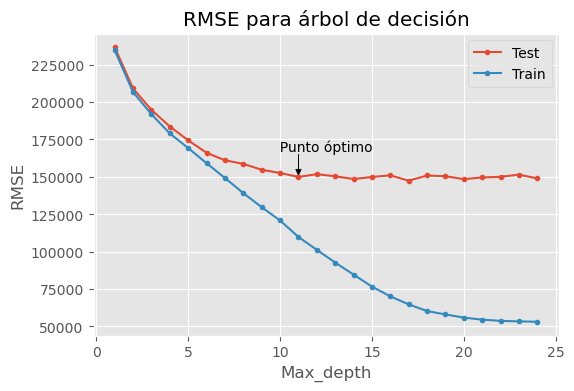

In [54]:
plt.figure(dpi=100)
plt.plot(hiper, rmse_te, '.-', label="Test")
plt.plot(hiper, rmse_tr, '.-', label="Train")
plt.title('RMSE para árbol de decisión')
plt.legend()
plt.xticks()
plt.ylabel("RMSE")
_ = plt.xlabel("Max_depth")

plt.arrow(11, 165000, 0, -10000, head_width=0.3, head_length=4000, fc='k', ec='k')
plt.text(9.5, 167000, '  Punto óptimo')

Aquí podemos observar que el punto óptimo se ubica para una profundidad del árbol, $max\_depth=11$. Esto nos indica que ese es el hiperparámetro más adecuado para entrenar el modelo. Veamos:

In [55]:
rmse_test, rmse_train, r2_mod = modelo(X_train, y_train, X_test, y_test, hiper=11, modelo='tree')
#r_adjusted = 1 - ((len(y_test)-1)/(len(y_test)-X_test.shape[1]-1))*(1-r2_mod)
print(f'RMSE entrenamiento: {np.round(rmse_train,2)}')
print(f'RMSE test: {np.round(rmse_test,2)}')
print(f'R cuadrado: {np.round(r2_mod,4)}')
#print(f'R cuadrado ajustado: {np.round(r_adjusted,2)}')

RMSE entrenamiento: 109788.04
RMSE test: 150440.24
R cuadrado: 0.7523


Al igual que el modelo de vecinos más cercanos, a pesar de que la métrica $R^2$ muestra un comportamiento relativamente bueno del modelo, el RMSE tiene valores muy grandes.

### Conclusiones de la sección de Machine Learning

* ¿Qué modelo escogería?¿Por qué?

  Vemos que ambos modelos han mejorado su desempeño respecto al modelo benchmark, aún así, todavía se podrían realizar unas mejoras, en especial en el tratamiento de los valores atípicos con mejores criterios. Desde las gráficas se puede observar con claridad que ambos modelos tienen un desempeño similar, aunque disperso, ya que lo ideal al comparar los valores predichos con los reales es que la diferencia o error entre estas cantidades sea el menor posible. Sin embargo, el que mejor comportamiento mostró según la métrica de desempeño fue el modelo de árbol de decisión. Es por ello que éste sería el modelo elegido a implementar para el dataset proporcionado y filtrado como sugieren.
    
  
* ¿Qué información no se está usando que podría ayudar al modelo?¿Qué información puede estar demás o repetida?

    Para un modelo de regresión, se pretende minimizar la métrica RMSE, y en los casos aquí presentados, éstos valores están elevados. Para mejorar este desempeño, se deben tratar de filtrar mejor los datos atípicos (outliers) con técnicas como el criterio de las 3$\sigma$ o transformación logarítmica de los datos. Además, tampoco hemos analizado la métrica $R^2_{adjusted}$, que da mejores resultados en sistemas multivariables. Realizar esto y adicionar información de las variables categóricas con una transformación *OneHot Encoder* permitirá mejorar los modelos. De igual manera, se podría usar PCA para encontrar condiciones que nos pueden ayudar a optimizar el modelo.